# 10-1. 프로젝트: 인물 모드 문제점 찾기

#### Step 1. 인물모드 직접 해 보기

In [1]:
import os
import urllib
import cv2
import numpy as np
from pixellib.semantic import semantic_segmentation
from matplotlib import pyplot as plt
import os

(406, 720, 3)


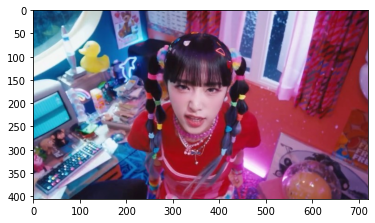

In [5]:
# os 모듈에 있는 getenv() 함수를 이용하여 읽고싶은 파일의 경로를 file_path에 저장
# 준비한 이미지 파일의 경로를 이용하여, 이미지 파일을 읽음
# cv2.imread(경로): 경로에 해당하는 이미지 파일을 읽어서 변수에 저장
img_path = os.getenv('HOME')+'/aiffel/exp5/yena_1.jpg'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)

# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 이미지 색상 채널을 변경 (BGR 형식을 RGB 형식으로 변경)
# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시, 입력은 RGB(A) 데이터 혹은 2D 스칼라 데이터
# https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.imshow.html
# plt.show(): 현재 열려있는 모든 figure를 표시 (여기서 figure는 이미지, 그래프 등)
# https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.show.html
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

#### 모델 로드

In [6]:
# 저장할 파일 이름을 결정합니다
# 1. os.getenv(x)함수는 환경 변수x의 값을 포함하는 문자열 변수를 반환합니다. model_dir 에 "/aiffel/human_segmentation/models" 저장
# 2. #os.path.join(a, b)는 경로를 병합하여 새 경로 생성 model_file 에 "/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5" 저장
# 1
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models' 
# 2
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5') 

# PixelLib가 제공하는 모델의 url입니다
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5' 

# 다운로드를 시작합니다
urllib.request.urlretrieve(model_url, model_file) # urllib 패키지 내에 있는 request 모듈의 urlretrieve 함수를 이용해서 model_url에 있는 파일을 다운로드 해서 model_file 파일명으로 저장

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7f0b780e52b0>)

In [7]:
model = semantic_segmentation() #PixelLib 라이브러리 에서 가져온 클래스를 가져와서 semantic segmentation을 수행하는 클래스 인스턴스를 만듬
model.load_pascalvoc_model(model_file) # pascal voc에 대해 훈련된 예외 모델(model_file)을 로드하는 함수를 호출

In [8]:
segvalues, output = model.segmentAsPascalvoc(img_path) # segmentAsPascalvoc()함 수 를 호출 하여 입력된 이미지를 분할, 분할 출력의 배열을 가져옴, 분할 은 pacalvoc 데이터로 학습된 모델을 이용

In [9]:
#pascalvoc 데이터의 라벨종류
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]

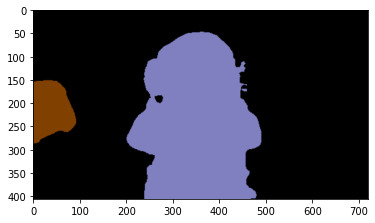

In [10]:
#segmentAsPascalvoc() 함수 를 호출하여 입력된 이미지를 분할한 뒤 나온 결과값 중 output을 matplotlib을 이용해 출력
plt.imshow(output)
plt.show()

In [12]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
person
tv


In [87]:
#컬러맵 만들기 
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20] 

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

In [89]:
colormap[15] #컬러맵 15에 해당하는 배열 출력 (pacalvoc에 LABEL_NAMES 15번째인 사람)
colormap[13] #컬러맵 12에 해당하는 배열 출력 (pacalvoc에 LABEL_NAMES 13번째인 개)
colormap[13] #컬러맵 13에 해당하는 배열 출력 (pacalvoc에 LABEL_NAMES 13번째인 말)

array([192,   0, 128])

In [15]:
seg_color = (128,128,192) # 색상순서 변경 - colormap의 배열은 RGB 순이며 output의 배열은 BGR 순서로 채널 배치가 되어 있어서

(406, 720)


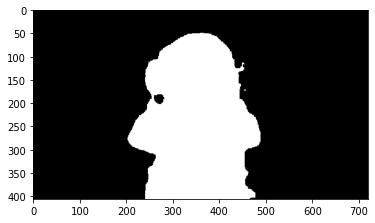

In [16]:
# output의 픽셀 별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)이 됩니다
# seg_color 값이 person을 값이 므로 사람이 있는 위치를 제외하고는 gray로 출력
# cmap 값을 변경하면 다른 색상으로 확인이 가능함
seg_map = np.all(output==seg_color, axis=-1) 
print(seg_map.shape) 
plt.imshow(seg_map, cmap='gray')
plt.show()

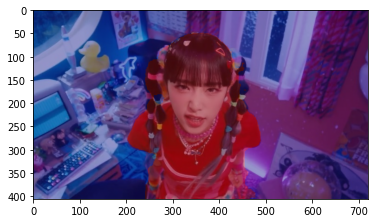

In [17]:
# 원본이미지를 img_show에 할당한뒤 이미지 사람이 있는 위치와 배경을 분리해서 표현한 color_mask 를 만든뒤 두 이미지를 합쳐서 출력
img_show = img_orig.copy()

# True과 False인 값을 각각 255과 0으로 바꿔줍니다
img_mask = seg_map.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꿔봅니다
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐봅니다
# 0.6과 0.4는 두 이미지를 섞는 비율입니다.
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

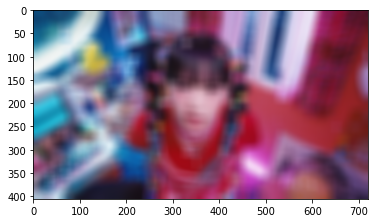

In [21]:
img_orig_blur = cv2.blur(img_orig, (25,25)) # 숫자를 올리면 블러 강도가 더 올라갑니다.

plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

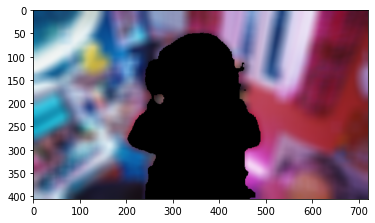

In [22]:
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경) 
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)

# cv2.bitwise_not(): 이미지가 반전됩니다. 배경이 0 사람이 255 였으나
# 연산을 하고 나면 배경은 255 사람은 0입니다.
img_bg_mask = cv2.bitwise_not(img_mask_color)

# cv2.bitwise_and()을 사용하면 배경만 있는 영상을 얻을 수 있습니다.
# 0과 어떤 수를 bitwise_and 연산을 해도 0이 되기 때문에 
# 사람이 0인 경우에는 사람이 있던 모든 픽셀이 0이 됩니다. 결국 사람이 사라지고 배경만 남아요!
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

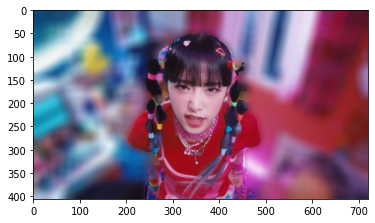

In [23]:
# np.where(조건, 참일때, 거짓일때)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용합니다.
img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
# plt.imshow(): 저장된 데이터를 이미지의 형식으로 표시한다.
# cv2.cvtColor(입력 이미지, 색상 변환 코드): 입력 이미지의 색상 채널을 변경
# cv2.COLOR_BGR2RGB: 원본이 BGR 순서로 픽셀을 읽다보니 
# 이미지 색상 채널을 변경해야함 (BGR 형식을 RGB 형식으로 변경)
plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

##### 인물모드 함수 만들기
* In: imagePath, segmentationModel, LABEL_NAMES, 
* Out: outFocusedImage

In [103]:
def out_focusing_mode(_img_path, _S_Model, _LABEL_NAMES, _colormap, _object):
    segvalues, output = model.segmentAsPascalvoc(_img_path)

    img_orig = cv2.imread(_img_path)
    img_orig_blur = cv2.blur(img_orig, (20,20))
    index = _LABEL_NAMES.index(_object)
    
    seg_color = _colormap[index]
    temp = seg_color[0]
    seg_color[0] = seg_color[2]
    seg_color[2] = temp
    seg_map = np.all(output==seg_color, axis=-1) 
    # True과 False인 값을 각각 255과 0으로 바꿔줍니다
    img_mask = seg_map.astype(np.uint8) * 255

    # 255와 0을 적당한 색상으로 바꿔봅니다
    color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

    img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
    # cv2.bitwise_not(): 이미지가 반전됩니다. 배경이 0 사람이 255 였으나
    # 연산을 하고 나면 배경은 255 사람은 0입니다.
    img_bg_mask = cv2.bitwise_not(img_mask_color)

    # cv2.bitwise_and()을 사용하면 배경만 있는 영상을 얻을 수 있습니다.
    # 0과 어떤 수를 bitwise_and 연산을 해도 0이 되기 때문에 
    # 사람이 0인 경우에는 사람이 있던 모든 픽셀이 0이 됩니다. 결국 사람이 사라지고 배경만 남아요!
    img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
    img_concat = np.where(img_mask_color==255, img_orig, img_bg_blur)
    
    return img_concat

In [99]:
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models' 
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5') 
if not os.path.isfile(model_file):
    model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5' 
    urllib.request.urlretrieve(model_url, model_file) 
model = semantic_segmentation() 
model.load_pascalvoc_model(model_file) 

In [100]:
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

In [101]:
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]

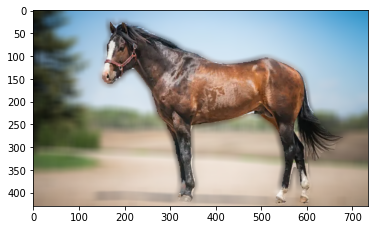

In [104]:
my_img_path = './img/horse_1.jpg'
portrait_img = out_focusing_mode(my_img_path, model, LABEL_NAMES, colormap, LABEL_NAMES[13]) #LABEL_NAMES[13]은 말 입니다.

output_img_path = './img/' + os.path.splitext(os.path.basename(my_img_path))[0] +'_out.jpg'
cv2.imwrite(output_img_path, portrait_img)
plt.imshow(cv2.cvtColor(portrait_img, cv2.COLOR_BGR2RGB))
plt.show()

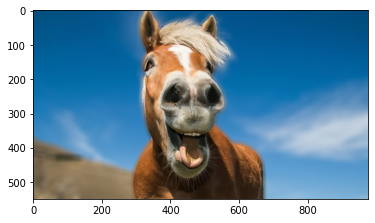

In [112]:
my_img_path = './img/horse_2.jpg'
portrait_img = out_focusing_mode(my_img_path, model, LABEL_NAMES, colormap, LABEL_NAMES[13])

output_img_path = './img/' + os.path.splitext(os.path.basename(my_img_path))[0] +'_out.jpg'
cv2.imwrite(output_img_path, portrait_img)
plt.imshow(cv2.cvtColor(portrait_img, cv2.COLOR_BGR2RGB))
plt.show()

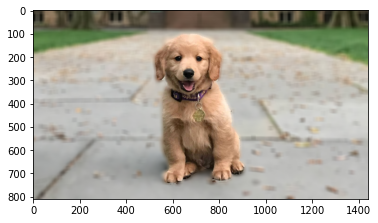

In [106]:
my_img_path = './img/dog_1.jpg'
portrait_img = out_focusing_mode(my_img_path, model, LABEL_NAMES, colormap, LABEL_NAMES[12]) #LABEL_NAMES[13]은 dog 입니다.


output_img_path = './img/' + os.path.splitext(os.path.basename(my_img_path))[0] +'_out.jpg'
cv2.imwrite(output_img_path, portrait_img)
plt.imshow(cv2.cvtColor(portrait_img, cv2.COLOR_BGR2RGB))
plt.show()

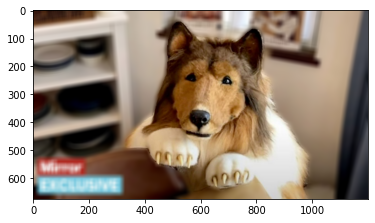

In [114]:
my_img_path = './img/dog_2.jpg'
portrait_img = out_focusing_mode(my_img_path, model, LABEL_NAMES, colormap, LABEL_NAMES[12]) #LABEL_NAMES[13]은 dog 입니다.

output_img_path = './img/' + os.path.splitext(os.path.basename(my_img_path))[0] +'_out.jpg'
cv2.imwrite(output_img_path, portrait_img)
plt.imshow(cv2.cvtColor(portrait_img, cv2.COLOR_BGR2RGB))
plt.show()

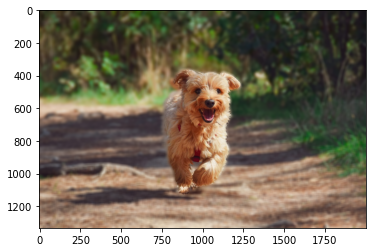

In [108]:
my_img_path = './img/dog_3.jpg'
portrait_img = out_focusing_mode(my_img_path, model, LABEL_NAMES, colormap, LABEL_NAMES[12]) #LABEL_NAMES[13]은 dog 입니다.

output_img_path = './img/' + os.path.splitext(os.path.basename(my_img_path))[0] +'_out.jpg'
cv2.imwrite(output_img_path, portrait_img)
plt.imshow(cv2.cvtColor(portrait_img, cv2.COLOR_BGR2RGB))
plt.show()

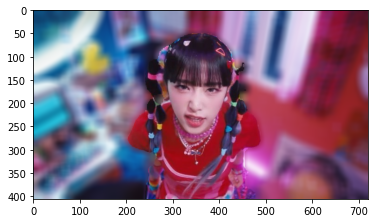

In [80]:
my_img_path = './img/yena_1.jpg'
portrait_img = out_focusing_mode(my_img_path, model, LABEL_NAMES, colormap, LABEL_NAMES[15]) #LABEL_NAMES[15]은 사람 입니다.

output_img_path = './img/' + os.path.splitext(os.path.basename(my_img_path))[0] +'_out.jpg'
cv2.imwrite(output_img_path, portrait_img)
plt.imshow(cv2.cvtColor(portrait_img, cv2.COLOR_BGR2RGB))
plt.show()

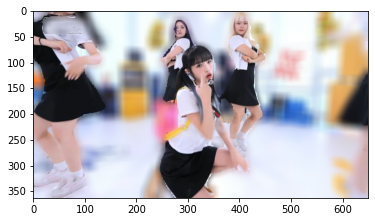

In [109]:
my_img_path = './img/yena_2.jpg'
portrait_img = out_focusing_mode(my_img_path, model, LABEL_NAMES, colormap, LABEL_NAMES[15])
# mask_img = mask_mode(my_img_path, model, LABEL_NAMES)

# plt.imshow(cv2.cvtColor(mask_img, cv2.COLOR_BGR2RGB))
# plt.show()

output_img_path = './img/' + os.path.splitext(os.path.basename(my_img_path))[0] +'_out.jpg'
cv2.imwrite(output_img_path, portrait_img)

plt.imshow(cv2.cvtColor(portrait_img, cv2.COLOR_BGR2RGB))
plt.show()

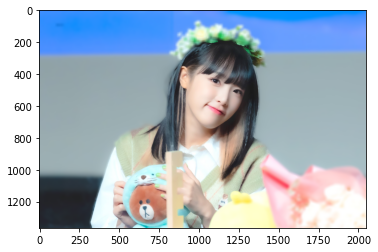

In [116]:
my_img_path = './img/yena_3.jpg'
portrait_img = out_focusing_mode(my_img_path, model, LABEL_NAMES, colormap, LABEL_NAMES[15])
output_img_path = './img/' + os.path.splitext(os.path.basename(my_img_path))[0] +'_out.jpg'
cv2.imwrite(output_img_path, portrait_img)
plt.imshow(cv2.cvtColor(portrait_img, cv2.COLOR_BGR2RGB))
plt.show()

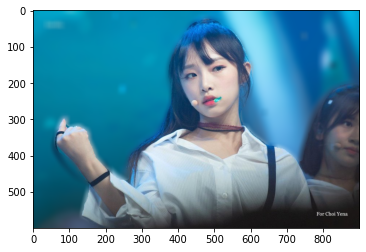

In [111]:
my_img_path = './img/yena_4.jpg'
portrait_img = out_focusing_mode(my_img_path, model, LABEL_NAMES, colormap, LABEL_NAMES[15])
output_img_path = './img/' + os.path.splitext(os.path.basename(my_img_path))[0] +'_out.jpg'
cv2.imwrite(output_img_path, portrait_img)
plt.imshow(cv2.cvtColor(portrait_img, cv2.COLOR_BGR2RGB))
plt.show()

#### Step 2. 사진에서 문제점 찾기

이미지 보여주는 함수 작성

In [74]:
def show_image(_orgImg_path, _portrait_img_path):
    orgImg = cv2.imread(_orgImg_path)
    portrait_img = cv2.imread(_portrait_img_path)
    # Figure 생성
    fig = plt.figure(figsize=(orgImg.shape[1] / 72 * 2 , orgImg.shape[0] / 72 * 2))

    # 첫 번째 이미지 subplot 생성
    ax1 = fig.add_subplot(2, 1, 1)
    ax1.imshow(cv2.cvtColor(orgImg, cv2.COLOR_BGR2RGB))
    ax1.set_title('org Image')

    # 두 번째 이미지 subplot 생성
    ax2 = fig.add_subplot(2, 1, 2)
    ax2.imshow(cv2.cvtColor(portrait_img, cv2.COLOR_BGR2RGB))
    ax2.set_title('portrait Image')

    # 축 숨기기
    # ax1.axis('off')
    # ax2.axis('off')

    # 그림 표시
    plt.show()

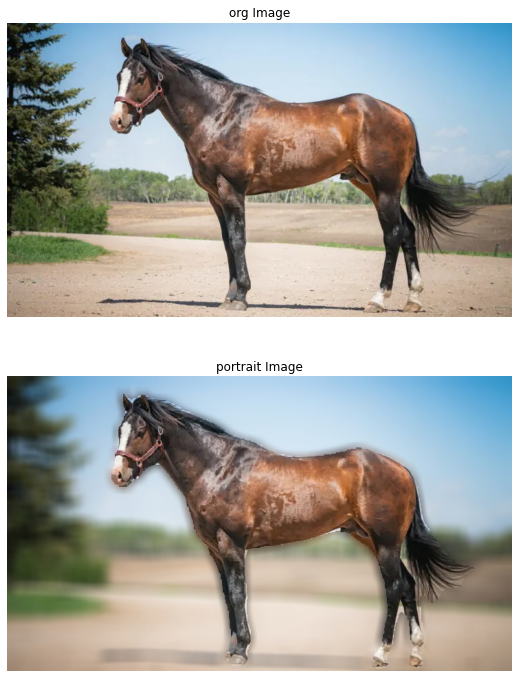

In [117]:
my_img_path = './img/horse_1.jpg'
output_img_path = './img/' + os.path.splitext(os.path.basename(my_img_path))[0] +'_out.jpg'
show_image(my_img_path, output_img_path)

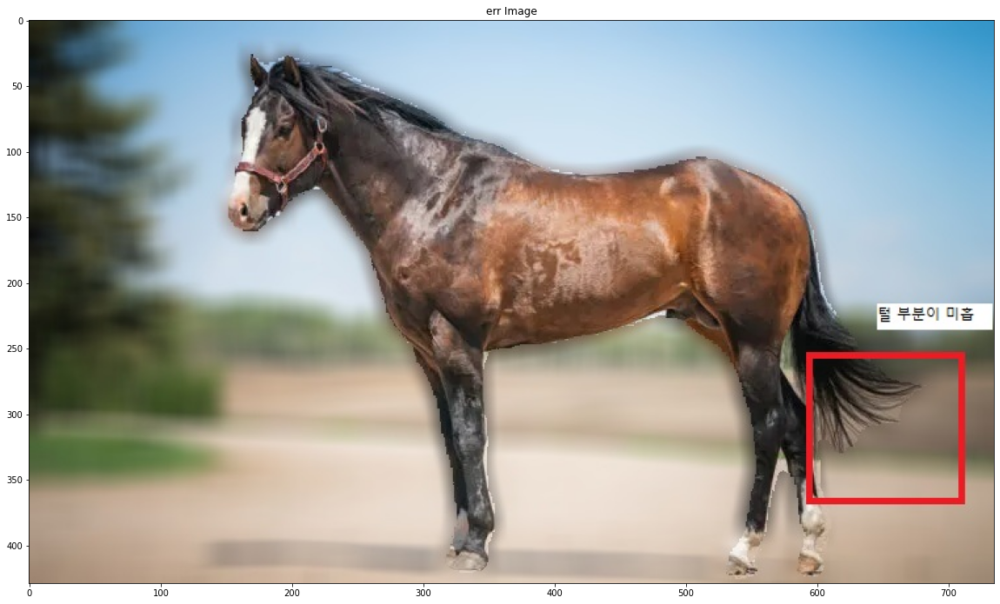

In [125]:
err_img_path = './img/horse_1_out_err.jpg'
err_img = cv2.imread(err_img_path)
fig = plt.figure(figsize=(err_img.shape[1] / 72 * 2 , err_img.shape[0] / 72 * 2))
ax1 = fig.add_subplot(1, 1, 1)
ax1.imshow(cv2.cvtColor(err_img, cv2.COLOR_BGR2RGB))
ax1.set_title('err Image')
plt.show()

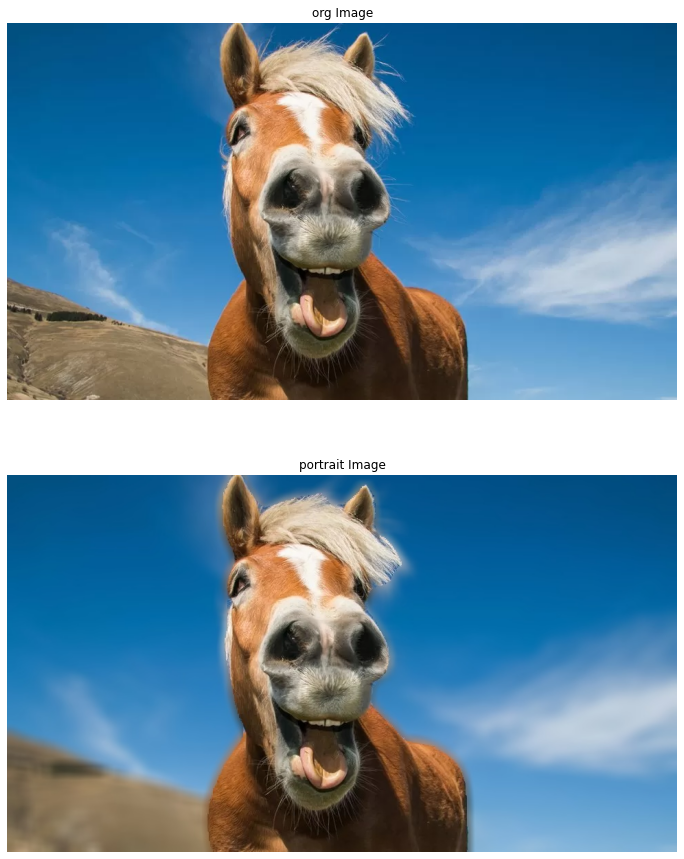

In [118]:
my_img_path = './img/horse_2.jpg'
output_img_path = './img/' + os.path.splitext(os.path.basename(my_img_path))[0] +'_out.jpg'
show_image(my_img_path, output_img_path)

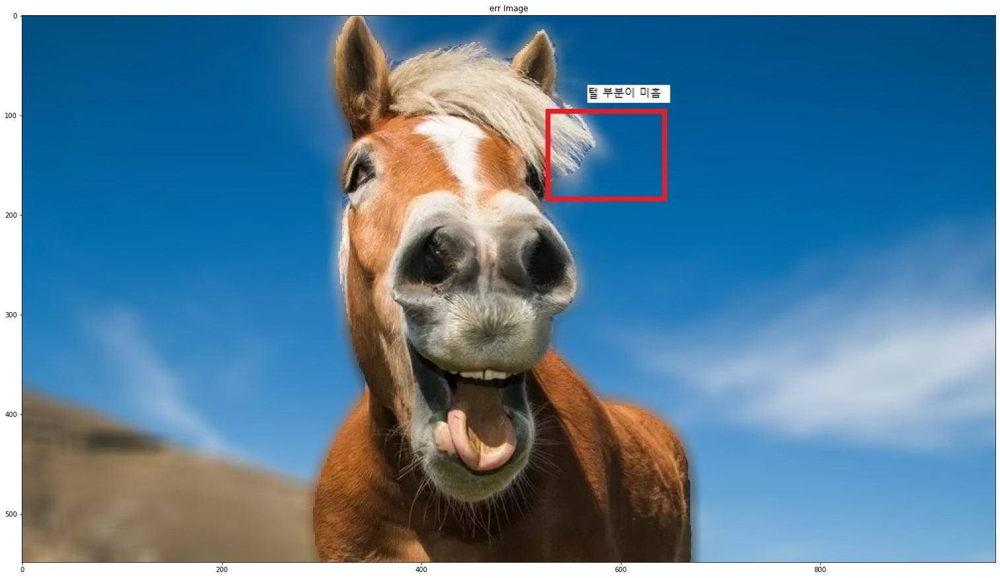

In [124]:
err_img_path = './img/horse_2_out_err.jpg'
err_img = cv2.imread(err_img_path)
fig = plt.figure(figsize=(err_img.shape[1] / 72 * 2 , err_img.shape[0] / 72 * 2))
ax1 = fig.add_subplot(1, 1, 1)
ax1.imshow(cv2.cvtColor(err_img, cv2.COLOR_BGR2RGB))
ax1.set_title('err Image')
plt.show()

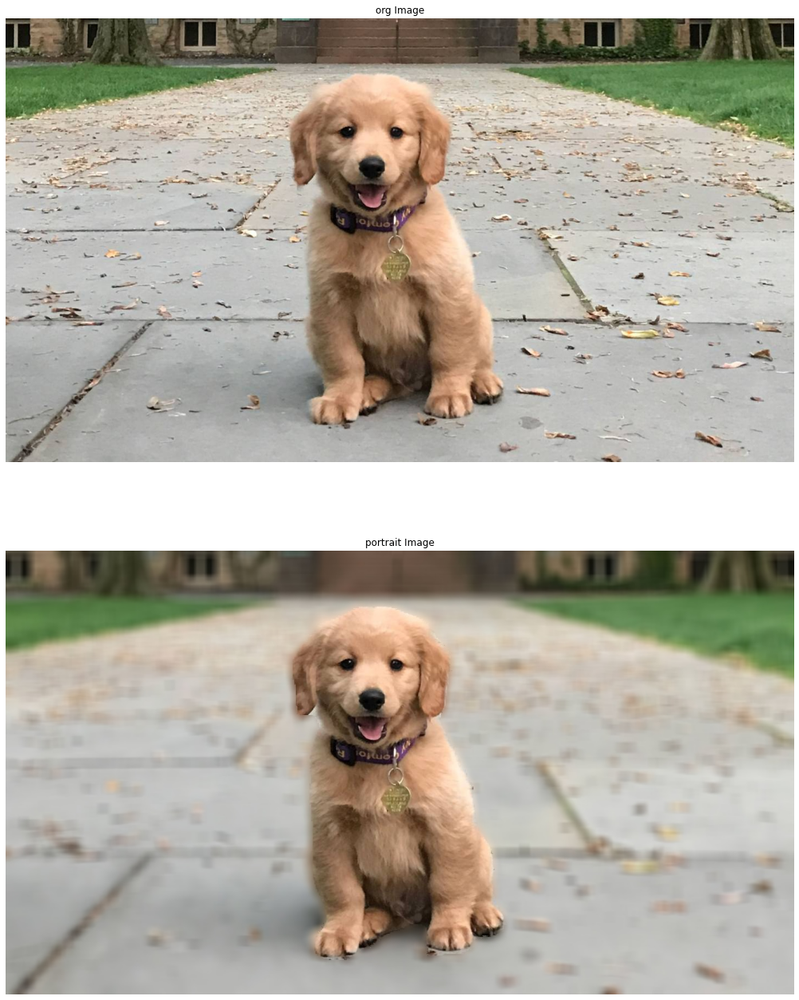

In [119]:
my_img_path = './img/dog_1.jpg'
output_img_path = './img/' + os.path.splitext(os.path.basename(my_img_path))[0] +'_out.jpg'
show_image(my_img_path, output_img_path)

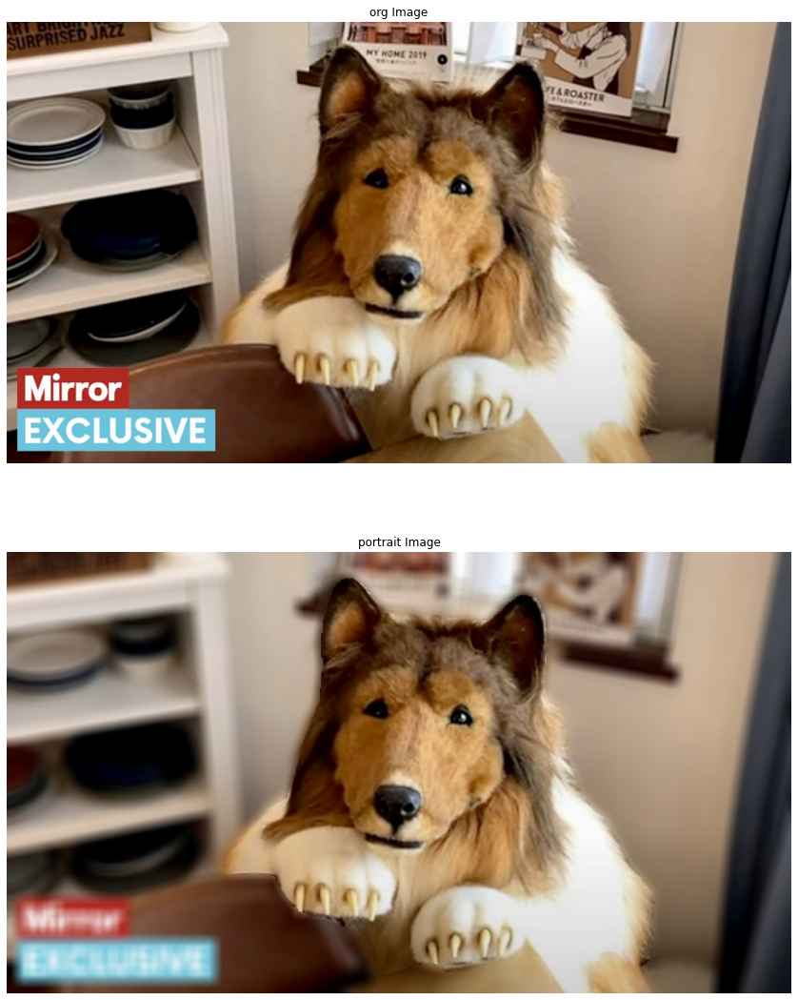

In [120]:
my_img_path = './img/dog_2.jpg'
output_img_path = './img/' + os.path.splitext(os.path.basename(my_img_path))[0] +'_out.jpg'
show_image(my_img_path, output_img_path)

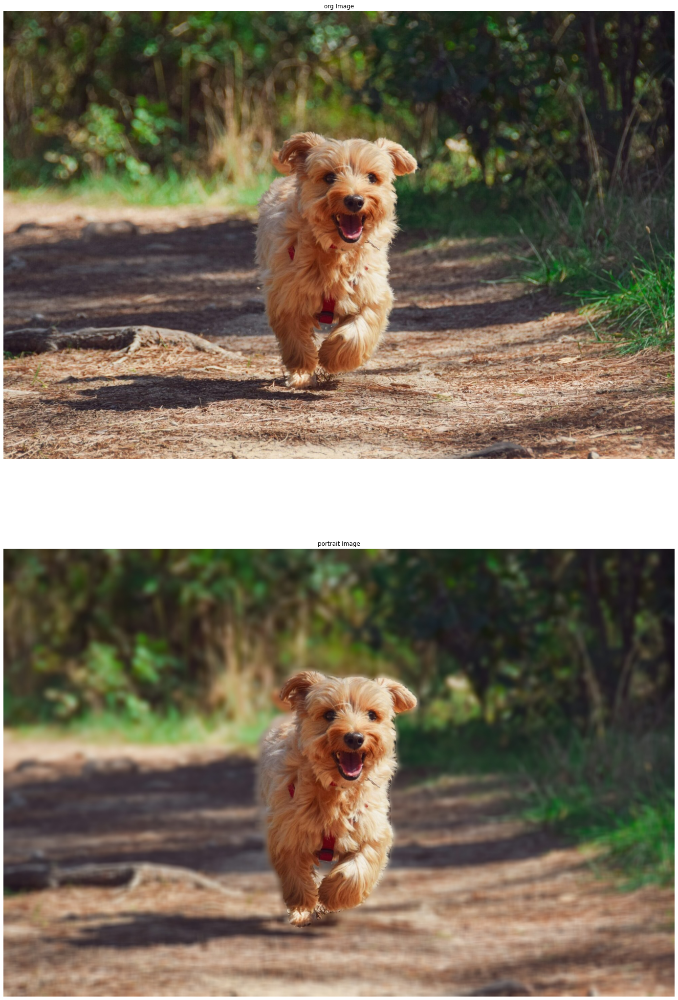

In [121]:
my_img_path = './img/dog_3.jpg'
output_img_path = './img/' + os.path.splitext(os.path.basename(my_img_path))[0] +'_out.jpg'
show_image(my_img_path, output_img_path)

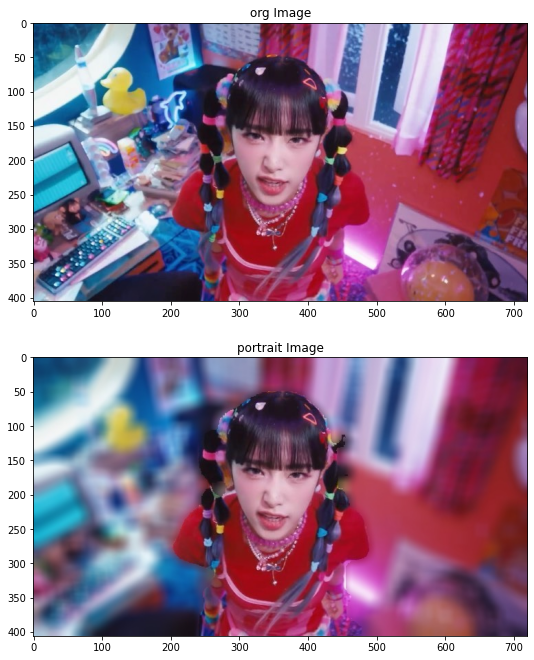

In [57]:
my_img_path = './img/yena_1.jpg'
output_img_path = './img/' + os.path.splitext(os.path.basename(my_img_path))[0] +'_out.jpg'
show_image(my_img_path, output_img_path)

이 사진은 문제 없이 매우 잘 찾은 것 같습니다.

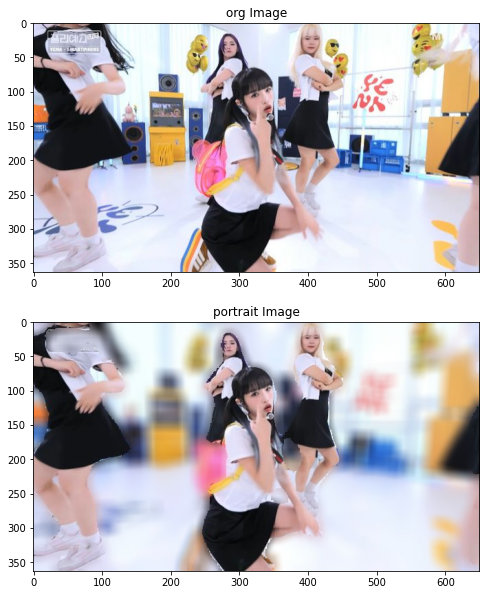

In [59]:
my_img_path = './img/yena_2.jpg'
output_img_path = './img/' + os.path.splitext(os.path.basename(my_img_path))[0] +'_out.jpg'
show_image(my_img_path, output_img_path)

인물이 많고 글씨 등 때문에 제대로 처리가 되지 않은 것 같습니다.

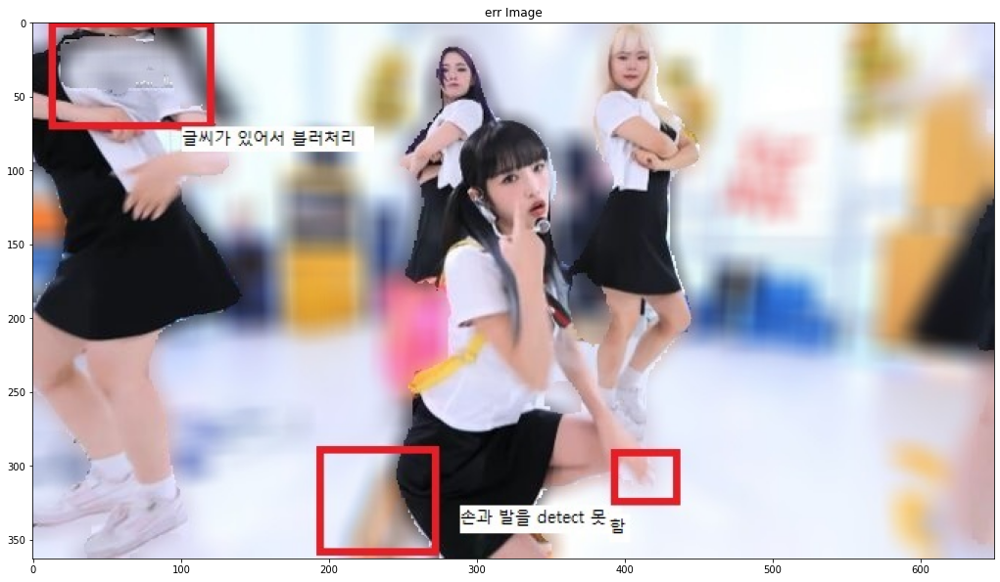

In [77]:
err_img_path = './img/yena_2_out_err.jpg'
err_img = cv2.imread(err_img_path)
fig = plt.figure(figsize=(err_img.shape[1] / 72 * 2 , err_img.shape[0] / 72 * 2))
ax1 = fig.add_subplot(1, 1, 1)
ax1.imshow(cv2.cvtColor(err_img, cv2.COLOR_BGR2RGB))
ax1.set_title('err Image')
plt.show()

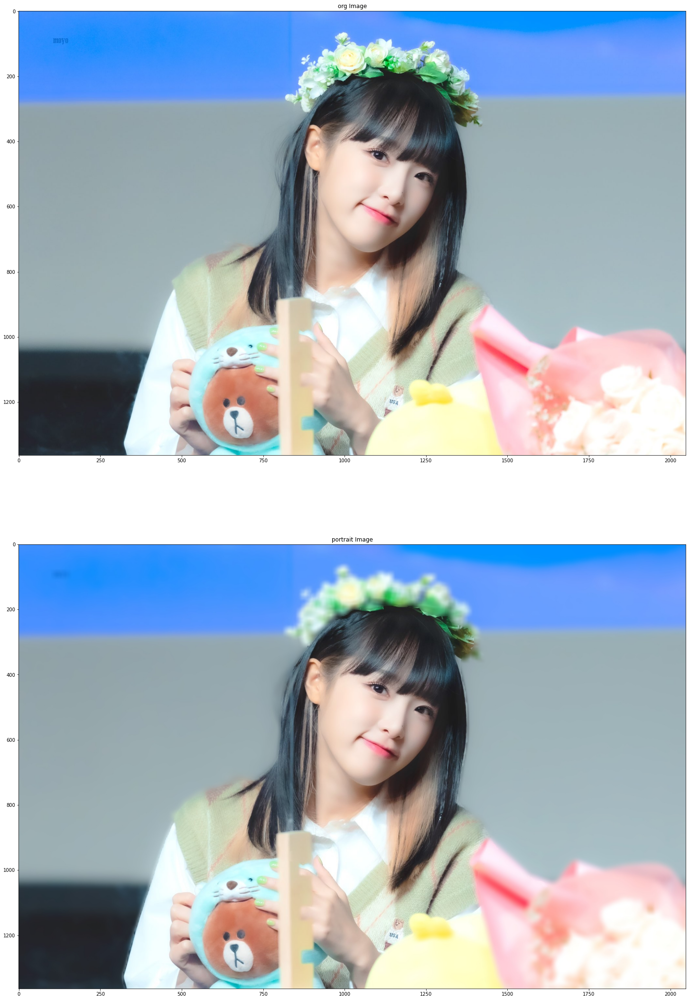

In [71]:
my_img_path = './img/yena_3.jpg'
output_img_path = './' + os.path.splitext(os.path.basename(my_img_path))[0] +'_out.jpg'
show_image(my_img_path, output_img_path)

문제 없이 잘 된것 같습니다.

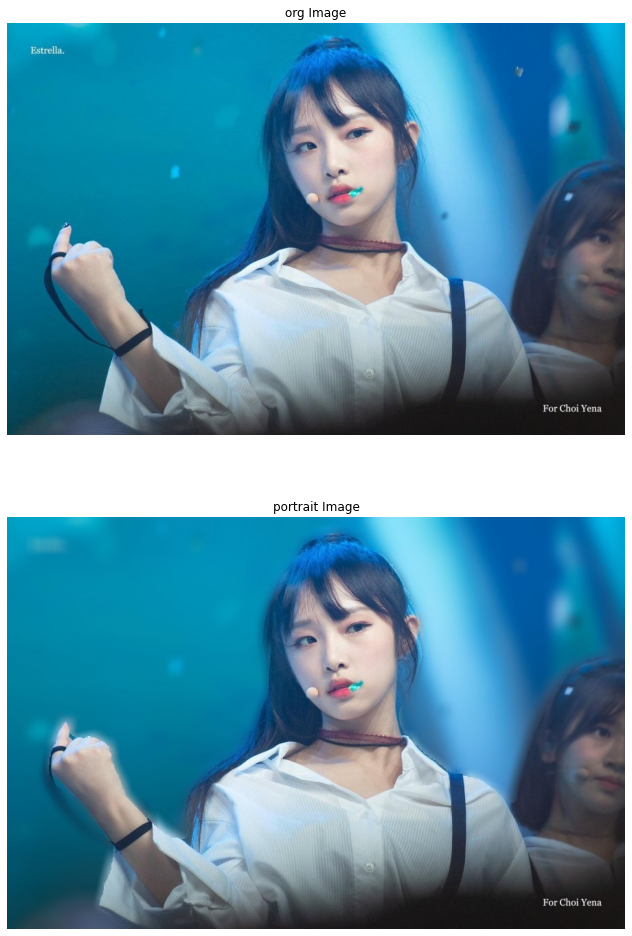

In [75]:
my_img_path = './img/yena_4.jpg'
output_img_path = './img/' + os.path.splitext(os.path.basename(my_img_path))[0] +'_out.jpg'
show_image(my_img_path, output_img_path)

이번에는 특이하게 글씨를 detect를 못 했네요..

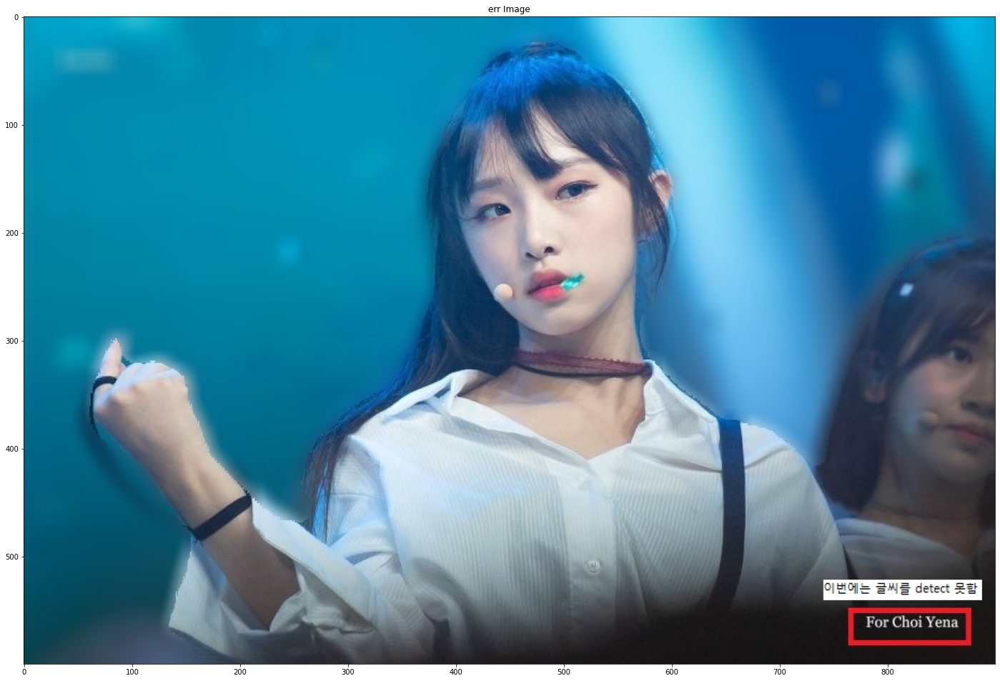

In [76]:
err_img_path = './img/yena_4_out_err.jpg'
err_img = cv2.imread(err_img_path)
fig = plt.figure(figsize=(err_img.shape[1] / 72 * 2 , err_img.shape[0] / 72 * 2))
ax1 = fig.add_subplot(1, 1, 1)
ax1.imshow(cv2.cvtColor(err_img, cv2.COLOR_BGR2RGB))
ax1.set_title('err Image')
plt.show()

사람이 많을 때 중앙에 있는 사람만 강조 해 보기 (실패!!!)

#### 비교적 혼자 있는 사진은 인물 사진 모드 적용이 잘 된것으로 보이지만, 여러 사람 혹은 인물과 물체가 겹쳐 있는 등 복잡한 상황에서 결과는 아쉬움을 보였습니다.

### Step 3. 해결 방법을 제안해 보기
+ 더 깊고 복잡한 모델 사용: 보케 효과를 위해 더 높은 수준의 세그멘테이션 정확도를 달성하려면, 더 깊고 복잡한 네트워크를 설계하거나 이미 검증된 고성능 모델들 (예: DeepLabv3+, Mask R-CNN 등)을 활용할 수 있습니다.
    * yolov5 segment이용
       + https://github.com/ultralytics/yolov5/tree/master/segment
       + yolov5 segment는 각 object별로 결과 도출하여 여러 사람이 있거나 글씨와 사람이 겹쳐 있는 등을 파악 가능 할 것으로 보입니다.
    * Segment Anything
       + https://github.com/facebookresearch/segment-anything
       + meta에서 만든 segment 하는 github soruse를 이용하여 최근 기술을 접목하여 더 상세한 결과 도출
    * 위와같이 더 좋은 모델을 사용하거나 학습 데이터를 잘 다루어서 좋은 학습 결과를 가져오고 자체적인 알고리즘을 더해서 피사체와 배경을 잘 구분 해야합니다.


### Step 4. 크로마키 적용하기

In [160]:
def chroma_key_mode(_img_path, _S_Model, _LABEL_NAMES, _colormap, _object, _background_img):
    segvalues, output = model.segmentAsPascalvoc(_img_path)

    img_orig = cv2.imread(_img_path)

    img_orig_resize = cv2.resize(_background_img, (img_orig.shape[1], img_orig.shape[0]))
    index = _LABEL_NAMES.index(_object)
    
    seg_color = _colormap[index]
    temp = seg_color[0]
    seg_color[0] = seg_color[2]
    seg_color[2] = temp
    seg_map = np.all(output==seg_color, axis=-1) 
    # True과 False인 값을 각각 255과 0으로 바꿔줍니다
    img_mask = seg_map.astype(np.uint8) * 255

    # 255와 0을 적당한 색상으로 바꿔봅니다
    color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

    img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)
    # cv2.bitwise_not(): 이미지가 반전됩니다. 배경이 0 사람이 255 였으나
    # 연산을 하고 나면 배경은 255 사람은 0입니다.
    img_bg_mask = cv2.bitwise_not(img_mask_color)

    # cv2.bitwise_and()을 사용하면 배경만 있는 영상을 얻을 수 있습니다.
    # 0과 어떤 수를 bitwise_and 연산을 해도 0이 되기 때문에 
    # 사람이 0인 경우에는 사람이 있던 모든 픽셀이 0이 됩니다. 결국 사람이 사라지고 배경만 남아요!
    img_bg = cv2.bitwise_and(img_orig_resize, img_bg_mask)
    img_concat = np.where(img_mask_color==255, img_orig, img_bg)
    
    return img_concat

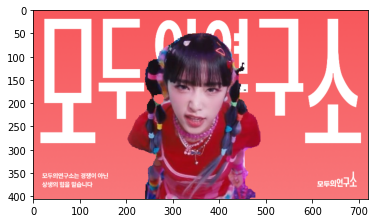

In [161]:
my_img_path = './img/yena_1.jpg'
background_img = cv2.imread('./img/ZoomBackground-ver2.png')
chroma_key_img = chroma_key_mode(my_img_path, model, LABEL_NAMES, colormap, LABEL_NAMES[15], background_img) #LABEL_NAMES[15]은 사람 입니다.

plt.imshow(cv2.cvtColor(chroma_key_img, cv2.COLOR_BGR2RGB))
plt.show()